# Diamond price

Author: Huan Tran Huu

Course Project, UC Irvine, Math 10, W22

## Introduction

For my project, I want to use the dataset "diamonds" from seaborn to explore how can we evaluate the price of a diamond base on some of its information such as cut, depth, carat, clarity and color.

## Main portion of the project

(You can either have all one section or divide into multiple sections)

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import altair as alt

In this step, I load the seaborn diamonond dataset, clean up the null value and delete some of the columns that I will not use for my project.

In [ ]:
df = sns.load_dataset('diamonds')
df.dropna(inplace=True)
df = df.drop(columns=['table','x', 'y','z'])

In [ ]:
df

,carat,cut,color,clarity,depth,price
0,0.23,Ideal,E,SI2,61.5,326
1,0.21,Premium,E,SI1,59.8,326
2,0.23,Good,E,VS1,56.9,327
3,0.29,Premium,I,VS2,62.4,334
4,0.31,Good,J,SI2,63.3,335
...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.8,2757
53936,0.72,Good,D,SI1,63.1,2757
53937,0.70,Very Good,D,SI1,62.8,2757
53938,0.86,Premium,H,SI2,61.0,2757


As I'm seeing that the carat and depth column has numeric values, so I want to use Scikitlearn for linear regression to explore how the price of diamonds relate to the carat and depth.

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
df[["carat","depth","price"]] = df[["carat","depth","price"]].apply(lambda col: pd.to_numeric(col, errors="coerce"), axis=0)

In [ ]:
# In here, I'm writing a function using f string to return an equation of linear regression
def findequation(x,y):
    reg = LinearRegression()
    reg.fit(df[x], df[y])
    return print(f"The equation is: {y} = {x[0]} x {reg.coef_[0]} + {x[1]} x {reg.coef_[1]} + {reg.intercept_}") 


In [ ]:
findequation(["carat","depth"], "price")

The equation is: price = carat x 7765.140663767152 + depth x -102.1653221580108 + 4045.3331826016815


From the equation above, we see that carat has positive relation to price, and depth has negative relation to price. So, the higher value of carat and the lower value of depth will make the diamond's price more expensive.

Now, I'm making a chart to see visualize how carat and depth relate to the price of diamonds.

In [ ]:
alt.Chart(df[:5000]).mark_circle().encode(
    x = alt.X("carat", scale = alt.Scale(zero=False)),
    y = alt.Y("depth", scale = alt.Scale(zero=False)), 
    color=alt.Color("price", title="Price"),
    tooltip = ["carat","depth", "price"]
).properties(
    title="Diamond Chart",
    width=700,
    height=500,
).add_selection(alt.selection_interval())

alt.Chart(...)

From the chart above, it is very clear that the higher values of carat have a higher price. However, it is not clear that the lower values of depth relate to a cheaper price. The reason that I think for that is because the coefficient of carat from the equation that I get get earlier is very small. It is -102, compare to 7765 from the carat's coefficient. So, I think the price will not fluctuate very much relate to the values of depth. 

Now, let's explore the other values of a diamond such as clarity, cut and color.

Since the value for the clarity, cut and color are not numerical values. I will use KNeighborsClassifier to explore these values.  

First, I want to explore the values and categories of clarity.

In [ ]:
df["clarity"].value_counts()

SI1     13065
VS2     12258
SI2      9194
VS1      8171
VVS2     5066
VVS1     3655
IF       1790
I1        741
Name: clarity, dtype: int64

I put an image for diamond's clarity below for better understanding.

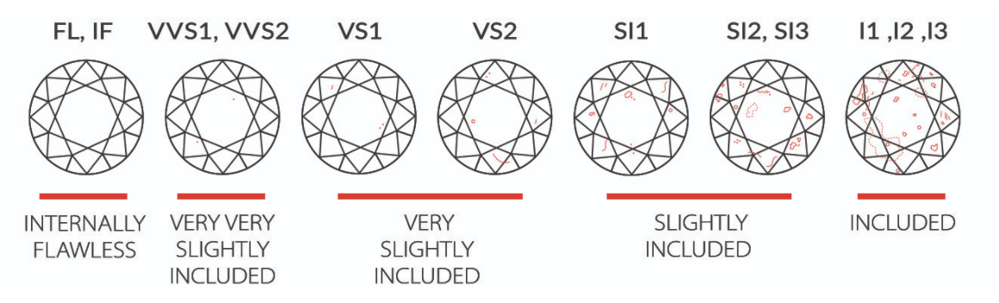

In [ ]:
from IPython import display
display.Image("/work/clarity.png")

In [ ]:
df["color"].unique()

['E', 'I', 'J', 'H', 'F', 'G', 'D']
Categories (7, object): ['D', 'E', 'F', 'G', 'H', 'I', 'J']

As the color category seems very strange to me, I did a research and came up with an image below.

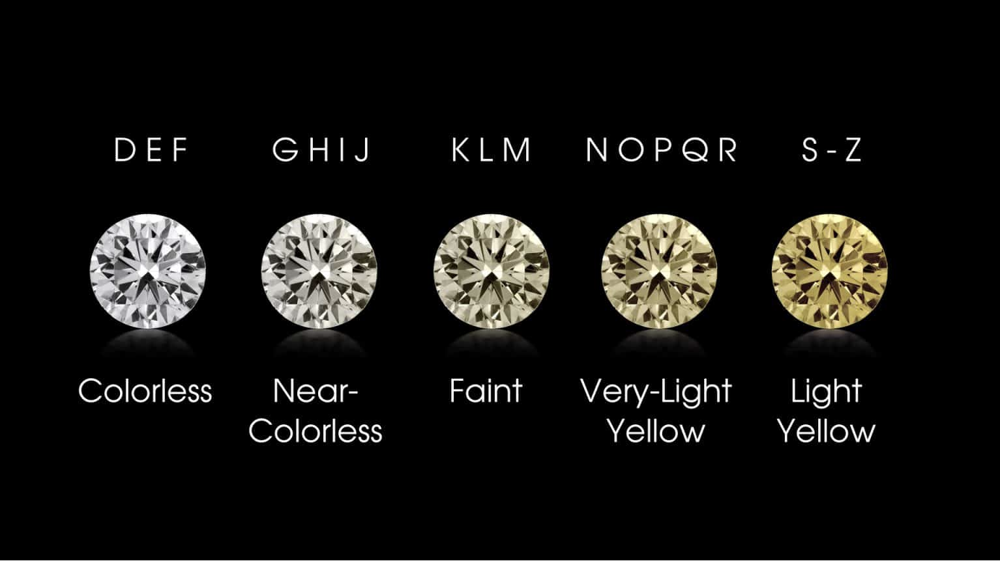

In [ ]:
from IPython import display
display.Image("/work/color.png")

For column cut, I also want to explore how many diamonds with a specific cut in the dataset. But I want to use for loop and f string.

In [ ]:
for a,b in df.groupby("cut"):
    print(f"The number of {a} cut in the data is {b.shape[0]} values")

The number of Ideal cut in the data is 21551 values
The number of Premium cut in the data is 13791 values
The number of Very Good cut in the data is 12082 values
The number of Good cut in the data is 4906 values
The number of Fair cut in the data is 1610 values


From the information above, I see that the number of Good cut is very low (1610) compare to other cuts. So, I decide to create a sub data frame contains only Ideal, Premium, Very Good and Good cut. But first, I want to highlight these 4 category in the original dataframe to see how it looks using pandas styler.

In [ ]:
def highlight(x):
    if "Ideal" in x:
        return 'color:white;background-color:red'
    if "Premium" in x:
        return 'color:white;background-color:blue'
    if "Very Good" in x:
        return 'color:white;background-color:purple'
    if "Good" in x:
        return 'color:white;background-color:green'
    else:
        return None

In [ ]:
df[:20].style.applymap(highlight,subset=["cut"])

,carat,cut,color,clarity,depth,price
0,0.230000,Ideal,E,SI2,61.500000,326
1,0.210000,Premium,E,SI1,59.800000,326
2,0.230000,Good,E,VS1,56.900000,327
3,0.290000,Premium,I,VS2,62.400000,334
4,0.310000,Good,J,SI2,63.300000,335
5,0.240000,Very Good,J,VVS2,62.800000,336
6,0.240000,Very Good,I,VVS1,62.300000,336
7,0.260000,Very Good,H,SI1,61.900000,337
8,0.220000,Fair,E,VS2,65.100000,337
9,0.230000,Very Good,H,VS1,59.400000,338


Below is a sub data that contains only top 4 cut

In [ ]:
subdf = df[df.cut.isin(df.cut.value_counts()[:4].index)].copy()

From the information that we have, the number of Ideal cut diamonds and SI1 is the largest in this data frame. So, I think the combo Ideal and SI1 will also the largest in this data.

Now, I am writing some codes to test my guess.

In [ ]:
# In this step, I'm using groupby to create a dictionary d.
d={}
for a,b in subdf.groupby(["cut","clarity"], sort=True):
    d[(a[0],a[1])]=b.shape[0]

In [ ]:
# Now, I'm sorting my order in ascending order. I'm using for loop with counter to print out the top 5 combo diamonds.
counter = 0
for n,m in sorted(d.items(),reverse=True, key=lambda item: item[1]):
    print(f"The number of diamonds with {n[0]} cut and {n[1]} clarity is {m}")
    counter += 1

    if counter >= 5:
        break

The number of diamonds with Ideal cut and VS2 clarity is 5071
The number of diamonds with Ideal cut and SI1 clarity is 4282
The number of diamonds with Ideal cut and VS1 clarity is 3589
The number of diamonds with Premium cut and SI1 clarity is 3575
The number of diamonds with Premium cut and VS2 clarity is 3357


As the result, my guess was wrong because Ideal and VS2 is the largest combo diamons in this dataset.

Now, I want to explore the data with top 5 diamond combos above

First, I will create a subdata with feature engineering

In [ ]:
subdf["feature engineering"] = ((subdf["cut"] == "Ideal") & (subdf["clarity"] == "VS2")) | ((subdf["cut"] == "Ideal") & (subdf["clarity"] == "SI1")) | ((subdf["cut"] == "Ideal") & (subdf["clarity"] == "VS1")) | ((subdf["cut"] == "Premium") & (subdf["clarity"] == "SI1")) | ((subdf["cut"] == "Premium") & (subdf["clarity"] == "VS2")).copy()

I also create a function below to see if there is overfitting or underfitting base on the score value. The function will return the score values for both train set and test set. It also print out text in Blue if there is overfitting and print out Red text if there is underfitting.

The function contains the topic of KNeighborsClassifier, StandardScaler, train set and test set.

In [ ]:
def fitting(x,y,dataframe,k): # This function will take the input of x and y columns from the dataframe that we want to use, and k is the number of n_neighbors for the classifier.
    import sys
    from termcolor import colored, cprint # This is a library that I use to change the text color
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler() # This step create a scaled X from the x input
    scaler.fit(dataframe[x])
    X_scaled = scaler.transform(dataframe[x])
    clf = KNeighborsClassifier(n_neighbors=k)
    clf.fit(X_scaled,dataframe[y])
    X_train, X_test, y_train, y_test = train_test_split(X_scaled,dataframe[y],test_size=0.5)
    clf.fit(X_train, y_train)
    clf.predict(X_test)
    # Below is a if and else condition
    # It makes the function print out Blue color text if we have overfitting and otherwise it will print out Red color 
    # The overfitting and underfitting determine by the clf.score value. Overfittinf happens if we have greater score for the training set.
    if clf.score(X_test,y_test) < clf.score(X_train,y_train):
        return print(colored(f"The score for test set is {clf.score(X_test,y_test)} and the score for train set is {clf.score(X_train,y_train)} \nIt suggests overfitting as the score for train set is higher", 'blue', attrs=['reverse', 'blink']))
    else:
        return print(colored(f"The score for test set is {clf.score(X_test,y_test)} and the score for train set is {clf.score(X_train,y_train)} \nIt suggests underfitting as the score for train set is lower", 'red', attrs=['reverse', 'blink']))



In [ ]:
fitting(["feature engineering", "price"],"color",subdf,4)

The score for test set is 0.30789222243454994 and the score for train set is 0.5081215364035926 
It suggests overfitting as the score for train set is higher


Now, let's explore how color relate to the price of diamond. For this dataset, I only want to explore the color G and E so I create a sub dataframe contains only G and E

In [ ]:
subdf1 = df[(df["color"] == "G") | (df["color"] == "E")].copy()

Because G and E are not numerical value, so I convert it into numerical using labelencoder and call it newcolor.

In [ ]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
subdf1["newcolor"] = labelencoder.fit_transform(subdf1['color']).copy()

In [ ]:
subdf1["feature engineering"] = ((df["cut"] == "Ideal") & (df["clarity"] == "VS2")) | ((df["cut"] == "Ideal") & (df["clarity"] == "SI1")) | ((df["cut"] == "Ideal") & (df["clarity"] == "VS1")) | ((df["cut"] == "Premium") & (df["clarity"] == "SI1")) | ((df["cut"] == "Premium") & (df["clarity"] == "VS2")).copy()

In [ ]:
fitting(["feature engineering", "newcolor"],"price",subdf1,4)

The score for test set is 0.0002844950213371266 and the score for train set is 0.0005690440060698028 
It suggests overfitting as the score for train set is higher


Now, I want to make a graph to visualize the data 

In [ ]:
alt.data_transformers.disable_max_rows()
choice = alt.selection_multi(fields=['color'], bind='legend')
alt.Chart(df).mark_bar().encode(
    x = "cut",
    y = "clarity",
    color = "color",
    size = "price",
    tooltip = ["cut","clarity", "price"],
    opacity=alt.condition(choice, alt.value(1), alt.value(0.2))
).properties(
    title="Diamond Chart",
    width=600,
    height=500,
).add_selection(choice,alt.selection_interval())

alt.Chart(...)

From the chart that I made above, I think it is quite unorganize and difficult to see the relation between all of the categories. So, I think it is better to break it up into graphs with less columns for better visulization. 

In [ ]:
choice = alt.selection_multi(fields=['color'], bind='legend')
c1 = alt.Chart(df).mark_bar().encode(
    x = "cut",
    y = "price",
    color = "color",
    tooltip = ["cut","color", "price"],
    opacity=alt.condition(choice, alt.value(1), alt.value(0.2))
).add_selection(choice)
c1

alt.Chart(...)

In [ ]:
c2 = alt.Chart(df).mark_bar().encode(
    x='clarity',
    y='price',
    color='color',
).transform_filter(choice)

In [ ]:
c1|c2

alt.HConcatChart(...)

For this chart, something that we can learn from it is the color H has the highest SI1 clarity, or the color G has the highest VS2 clarity.

## Summary

In this project, I use LinearRegression from scikit learn to find the relation between carat, depth and price of diamonds. <br>
The equation that I found is:<br> 
Price = 7765 x carat - 102 x depth + 4045. <br>
It shows that carat has positive relation to price, and depth has negative relation to price. <br>
For the carat, clarity and color of the dataset, I use the KNeighborClassifier to explore these columns by doing train set and test set to see if there is overfitting. <br>
Finally, I try to make a chart using Altair for visualization for of the dataset. From the chart I can learn that the color H has the highest SI1 clarity, or the color G has the highest VS2 clarity.

## References

[Image for diamond color](https://www.igi.org/gemblog/putting-diamond-color-in-context/)<br>
[Image for diamond clarity](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.gemonediamond.com%2Fdiamond-clarity%2F&psig=AOvVaw3QHxjnGYKK_fOsnHiUMIpM&ust=1647050223085000&source=images&cd=vfe&ved=0CAsQjRxqFwoTCLCo-676vPYCFQAAAAAdAAAAABAD)<br>
[3 Ways to Add Images to Your Jupyter Notebook](https://ealizadeh.com/blog/3-ways-to-add-images-to-your-jupyter-notebook)<br>
[How to Print Colored Text in Python](https://www.studytonight.com/python-howtos/how-to-print-colored-text-in-python)<br>
[How do I sort a dictionary by value?](https://stackoverflow.com/questions/613183/how-do-i-sort-a-dictionary-by-value)<br>

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=be154ef9-2015-4add-aa14-41cb1ffb2854' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>